## YOLOv5

https://github.com/ultralytics/yolov5.git

In [1]:
%cd /content
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
%pip install -qr requirements.txt

import torch
from IPython.display import Image, clear_output

/content
Cloning into 'yolov5'...
remote: Enumerating objects: 15897, done.
remote: Counting objects: 100% (17/17), done.
remote: Compressing objects: 100% (16/16), done.
remote: Total 15897 (delta 5), reused 2 (delta 1), pack-reused 15880
Receiving objects: 100% (15897/15897), 14.56 MiB | 16.05 MiB/s, done.
Resolving deltas: 100% (10904/10904), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.5/188.5 kB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 614.4/614.4 kB 47.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.6 MB/s eta 0:00:00


* 안전모 데이터셋: https://public.roboflow.com/object-detection/hard-hat-workers

https://public.roboflow.com/ds/HSzjb19j05?key=mYws4wS3W4

In [2]:
%mkdir /content/yolov5/hhw
%cd /content/yolov5/hhw


/content/yolov5/hhw


In [ ]:
#  curl은 커맨드 아린용 데이터 전송 도구. -L 옵션을 사용하여 HTTP 위치 헤더를 따르기(리다이렉션을 따르도록 curl 을 사용할 수 있음)
!curl -L "https://public.roboflow.com/ds/HSzjb19j05?key=mYws4wS3W4" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

In [4]:
# yolov5s.pt를 적용하여 추가 학습없이 detecting
%cd /content/yolov5

!python detect.py --weights yolov5s.pt --img 416 --conf 0.25 --source hhw/test/images/

/content/yolov5
detect: weights=['yolov5s.pt'], source=hhw/test/images/, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-207-gdf48c20 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

100% 14.1M/14.1M [00:00<00:00, 356MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
image 1/1766 /content/yolov5/hhw/test/images/005298_jpg.rf.7d1070e4a462d4c636a68e64f2013761.jpg: 416x416 6 persons, 7.8ms
image 2/1766 /content/yolov5/hhw/test/images/005299_jpg.rf.a79cacc62cdd99ad871cf1786ad865ff.jpg: 416x416 (no detections), 7.8ms
image 3/1766 /content/yolov5/hhw/test/images/005300_jpg.rf.419d88422f77db

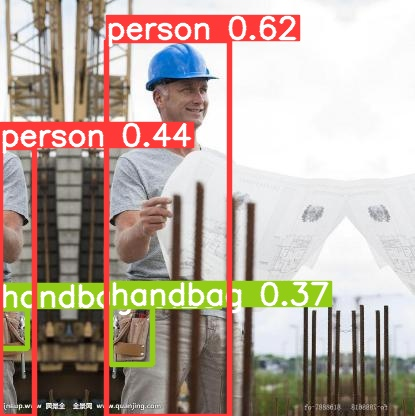

In [13]:
import glob
import random
from IPython.display import Image, display

image_name = random.choice(glob.glob('/content/yolov5/runs/detect/exp/*.jpg'))
display(Image(filename=image_name))

In [14]:
from glob import glob

train_img_list = glob('/content/yolov5/hhw/train/images/*.jpg')
test_img_list= glob('/content/yolov5/hhw/test/images/*.jpg')

print(len(train_img_list), len(test_img_list))

5269 1766


In [15]:
from sklearn.model_selection import train_test_split

test_img_list, val_img_list = train_test_split(test_img_list,test_size=0.5, random_state=777)
print(len(test_img_list), len(val_img_list))

883 883


In [17]:
# join 함수를 이용하여 각 이미지 리스트를 개행 문자를 이용하여 하나의 문자열로 합쳐서 각 파일에 쓴다.
import yaml

with open('/content/yolov5/hhw/train.txt', 'w') as f:
  f.write('\n'.join(train_img_list)+'\n')

with open('/content/yolov5/hhw/test.txt', 'w') as f:
  f.write('\n'.join(test_img_list)+'\n')

with open('/content/yolov5/hhw/val.txt', 'w') as f:
  f.write('\n'.join(val_img_list)+'\n')


In [18]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line,cell):
  with open(line,'w') as f:
    f.write(cell.format(**globals())) # 현재 전역 네임스페이스에 있는 모든 변수들을 딕셔너리 형태로 반환하여 포멧팅에 사용할 수 있게 함

In [19]:
%cat /content/yolov5/hhw/data.yaml

train: ../train/images
val: ../valid/images

nc: 3
names: ['head', 'helmet', 'person']

In [20]:
%%writetemplate /content/yolov5/hhw/data.yaml
train: ./hhw/train.txt
test: ./hhw/test.txt
val: ./hhw/val.txt

nc: 3
names: ['head', 'helmet', 'person']

In [21]:
%cat /content/yolov5/hhw/data.yaml

train: ./hhw/train.txt
test: ./hhw/test.txt
val: ./hhw/val.txt

nc: 3
names: ['head', 'helmet', 'person']


In [22]:
with open('/content/yolov5/hhw/data.yaml','r') as stream:
  num_classes = str(yaml.safe_load(stream)['nc'])
num_classes

'3'

In [ ]:
# 모델 구성

%cat /content/yolov5/models/yolov5s.yaml

In [24]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# Parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [ ]:
%cat /content/yolov5/models/custom_yolov5s.yaml

In [26]:
!pwd

/content/yolov5


In [27]:
%%time
%cd /content/yolov5
!python train.py --img 416 --batch 64 --epochs 50 --data ./hhw/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name hhw_results --cache

/content/yolov5
train: weights=, cfg=./models/custom_yolov5s.yaml, data=./hhw/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=64, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=hhw_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-207-gdf48c20 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_g

In [28]:
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

In [29]:
!ls /content/yolov5/runs/train/hhw_results/

confusion_matrix.png				     results.png
events.out.tfevents.1691460436.ff5a46b70d33.16542.0  train_batch0.jpg
F1_curve.png					     train_batch1.jpg
hyp.yaml					     train_batch2.jpg
labels_correlogram.jpg				     val_batch0_labels.jpg
labels.jpg					     val_batch0_pred.jpg
opt.yaml					     val_batch1_labels.jpg
P_curve.png					     val_batch1_pred.jpg
PR_curve.png					     val_batch2_labels.jpg
R_curve.png					     val_batch2_pred.jpg
results.csv					     weights


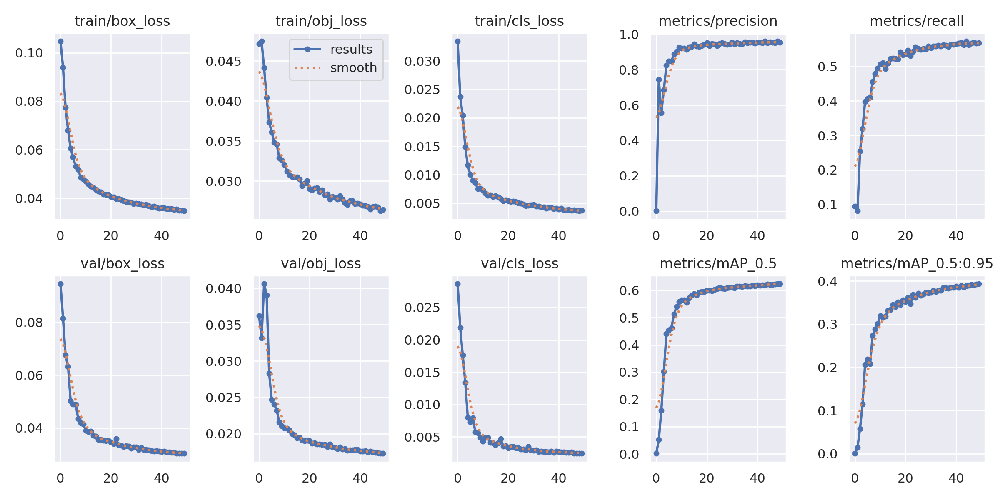

In [30]:
Image(filename='/content/yolov5/runs/train/hhw_results/results.png',width=1000)

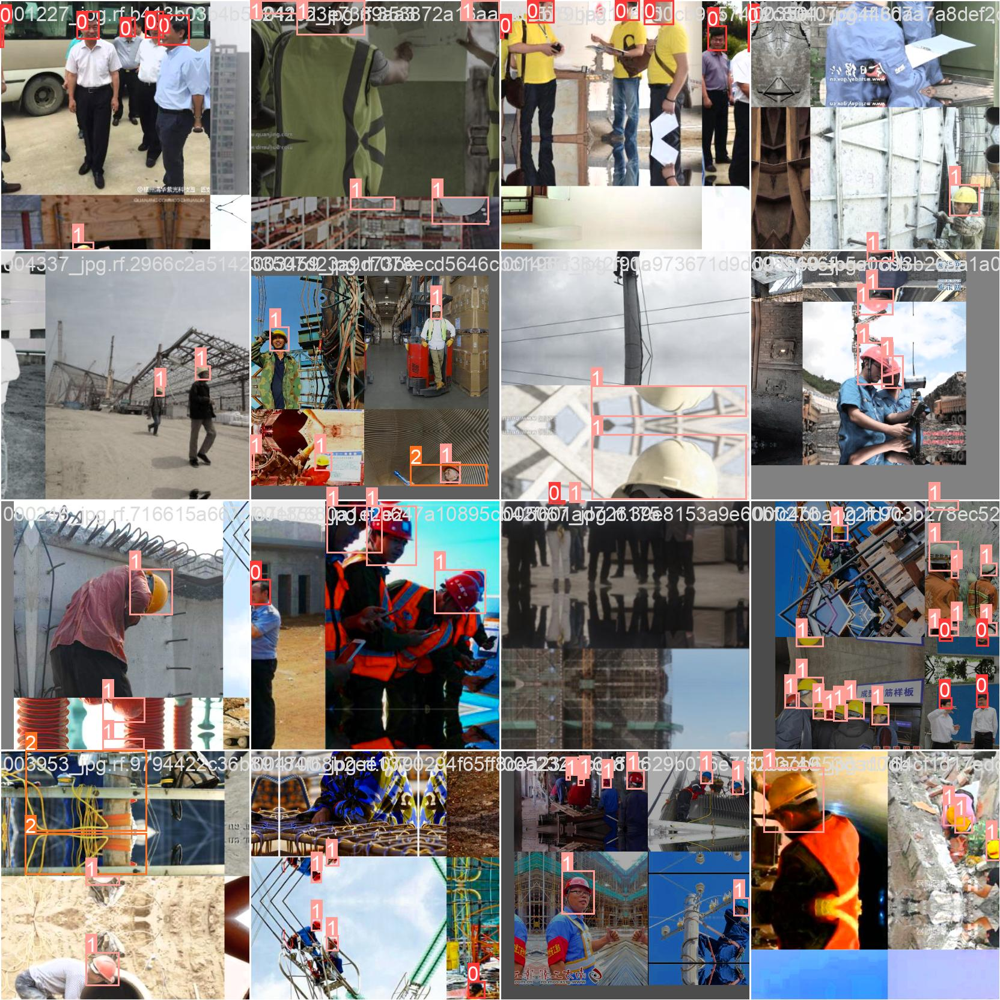

In [31]:
Image(filename='/content/yolov5/runs/train/hhw_results/train_batch0.jpg',width=1000)

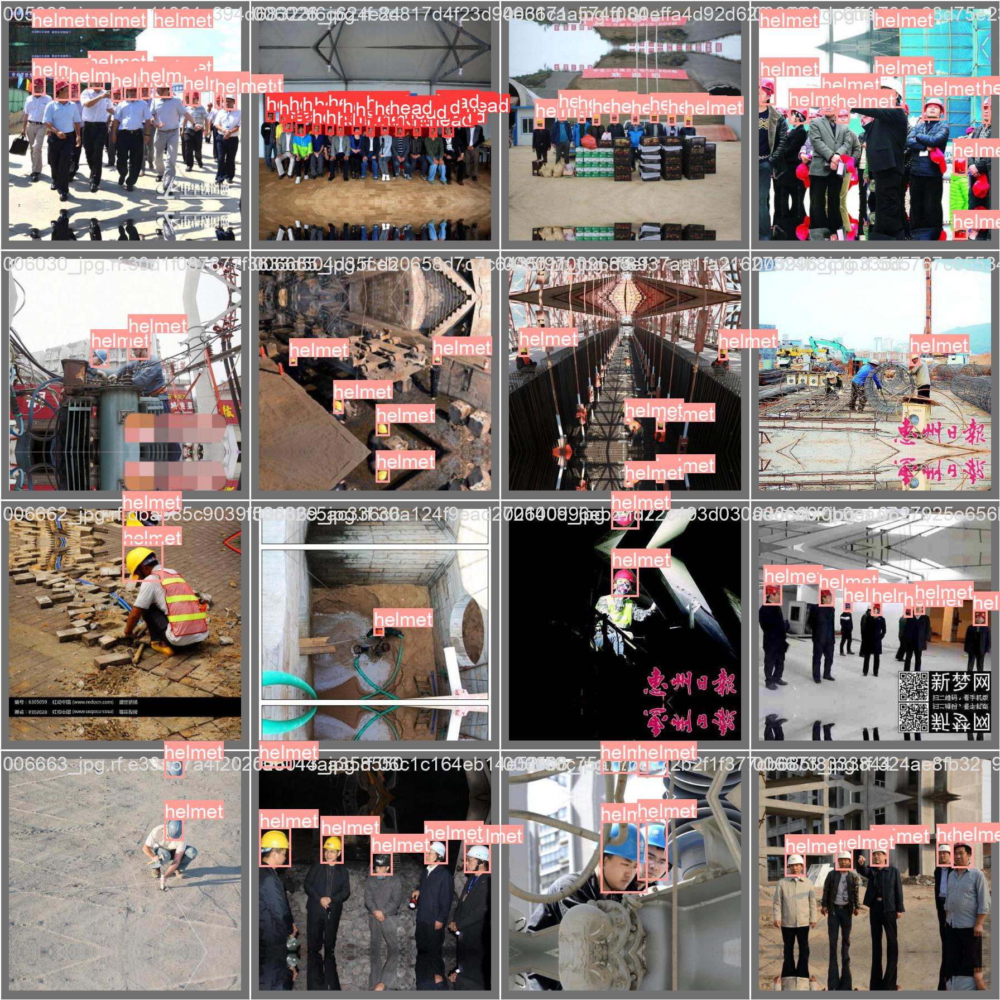

In [32]:
Image(filename='/content/yolov5/runs/train/hhw_results/val_batch0_labels.jpg',width=1000)

In [33]:
!mkdir /content/drive/MyDrive/hmkd1/강의/vision/model_hhw
%cp /content/yolov5/runs/train/hhw_results/weights/best.pt /content/drive/MyDrive/hmkd1/강의/vision/model_hhw

In [34]:
%cd /content/yolov5

/content/yolov5


In [35]:
# 검증
!python val.py --weights runs/train/hhw_results/weights/best.pt --data ./hhw/data.yaml --img 416 --iou 0.65

val: data=./hhw/data.yaml, weights=['runs/train/hhw_results/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.65, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-207-gdf48c20 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/yolov5/hhw/val.cache... 883 images, 0 backgrounds, 0 corrupt: 100% 883/883 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 28/28 [00:12<00:00,  2.27it/s]
                   all        883       4565      0.952      0.567      0.622      0.394
                  head        883       1083       0.91      0.841      0.909      0.569
                helmet      

In [36]:
# --task 설정 안해주면 default롤 'val'이 적용된다.
!python val.py --weights runs/train/hhw_results/weights/best.pt --data ./hhw/data.yaml --img 416 --task test

val: data=./hhw/data.yaml, weights=['runs/train/hhw_results/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-207-gdf48c20 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
test: Scanning /content/yolov5/hhw/test... 883 images, 0 backgrounds, 0 corrupt: 100% 883/883 [00:00<00:00, 4500.77it/s]
test: New cache created: /content/yolov5/hhw/test.cache
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 28/28 [00:11<00:00,  2.35it/s]
                   all        883       4350      0.958      0.572      0.621      0.388
                  head        883       1125      0.926

In [37]:
# 추론
!python detect.py --weights runs/train/hhw_results/weights/best.pt --img 416 --conf 0.4 --source ./hhw/test/images

detect: weights=['runs/train/hhw_results/weights/best.pt'], source=./hhw/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-207-gdf48c20 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/1766 /content/yolov5/hhw/test/images/005298_jpg.rf.7d1070e4a462d4c636a68e64f2013761.jpg: 416x416 9 helmets, 7.4ms
image 2/1766 /content/yolov5/hhw/test/images/005299_jpg.rf.a79cacc62cdd99ad871cf1786ad865ff.jpg: 416x416 1 helmet, 7.4ms
image 3/1766 /content/yolov5/hhw/test/images/005300_jpg.rf.419d88422f77db5d30bbb0e769c7c6

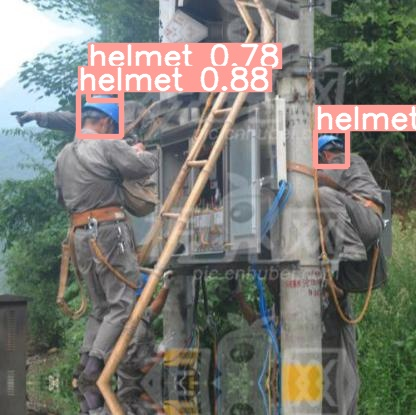

In [47]:
import glob
import random
from IPython.display import Image, display

image_name = random.choice(glob.glob('/content/yolov5/runs/detect/exp2/*.jpg'))
display(Image(filename=image_name))

In [ ]:
!mkdir /content/drive/MyDrive/hmkd1/강의/vision/hard_hat

In [ ]:
# 모델 내보내기

%cp /content/yolov5/runs/train/hhw_results/weights/best.pt /content/drive/MyDrive/hmkd1/강의/vision/hard_hat

In [ ]:
# 저장된 모델을 불러오기
%cp /content/drive/MyDrive/hmkd1/강의/vision/hard_hat/best.pt /content/yolov5

In [ ]:
# 저장된 모델로 detecting
!python detect.py --weights best.pt --img 416 --conf 0.25 --source hhw/test/images/

detect: weights=['best.pt'], source=hhw/test/images/, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-203-g0897415 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/1766 /content/yolov5/hhw/test/images/005298_jpg.rf.7d1070e4a462d4c636a68e64f2013761.jpg: 416x416 9 helmets, 7.4ms
image 2/1766 /content/yolov5/hhw/test/images/005299_jpg.rf.a79cacc62cdd99ad871cf1786ad865ff.jpg: 416x416 1 helmet, 7.4ms
image 3/1766 /content/yolov5/hhw/test/images/005300_jpg.rf.419d88422f77db5d30bbb0e769c7c600.jpg: 416x416 1 helmet, 7.4ms

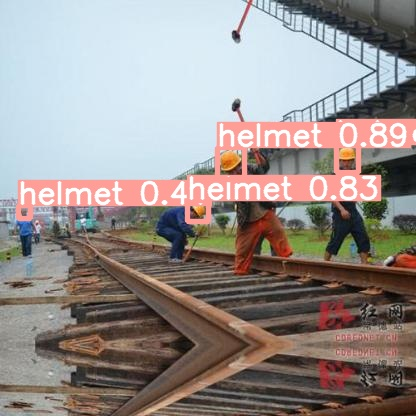

In [ ]:
import glob
import random
from IPython.display import Image, display

image_name = random.choice(glob.glob('/content/yolov5/runs/detect/exp3/*.jpg'))
display(Image(filename=image_name))